# LINMA2472:  Homework #4
## SIR epidemiological model over the *Iliad* network
##### Vincent CAMMARANO - Louis PARYS - Mattias VAN EETVELT

In [1]:
# imports, note scipy>=1.8 is needed
import numpy as np
import random
import networkx as nx
from IPython.display import Image
import matplotlib.pyplot as plt
import collections
from matplotlib.ticker import MaxNLocator
import statistics as stats
from collections import Counter
import seaborn as sns
from matplotlib import rc
import pandas as pd
import csv
import sklearn.cluster
import scipy
import plotly
import plotly.graph_objs as go
import random
import copy
import sklearn #pip install scikit-learn
import plotly.io as pio
import plotly.express as px
from community import community_louvain #pip install python-louvain
import plotly
import plotly.graph_objs as go
import time
import seaborn as sns
import matplotlib.cm as cm

from igraph import *
pio.renderers.default = "notebook_connected"
print("done")

done


## 1. Text traitement

In [2]:
book = []
with open('iliad.txt', "r", encoding="utf8" ) as input_f:  #if error: erase encoding="utf8"
    book = input_f.read()
    book = book.lower()
    book = list(filter(lambda x : x != '', book.split('\n\n')))
    
characters = []
with open('iliad_characters.txt', 'r') as char:
    characters = char.read()
    characters = list(filter(lambda x : x != '', characters.split('\n')))

list_to_delete = ['come', 'dear', 'first', 'go', 'may', 'nay', 'mt', 'o', 'son', 'sir', 'sleep',
                  'stand', 'thus', "king", "achaean", "trojan", "trojans","o","argives","ilius",
                  "troy", "danaan"]
#if character is in list_to_delete, delete it
for character in characters[:]:
    if character in list_to_delete:
        characters.remove(character)



#export New characters in txt file one character per line
with open('characters.txt', 'w') as f:
    for item in characters:
        f.write("%s \n" % item)
        


In [3]:
characters[:10]

['hector',
 'jove',
 'achilles',
 'priam',
 'ajax',
 'agamemnon',
 'patroclus',
 'menelaus',
 'atreus',
 'minerva']

In [4]:
#add 1 if a specific personnage is in a specific page
occurence_page = pd.DataFrame(0,columns=characters, index=(i for i in range(len(book))))
for i in range(len(book)):
    for personnage in characters:
        if personnage in book[i]:
            occurence_page.loc[[i], [personnage]] += 1
            

In [5]:
#create the confusion matrix by dot product
occurence = occurence_page.T.dot(occurence_page)
#fill diagonal with 0
np.fill_diagonal(occurence.values, 0)


In [6]:
#drop all rows filled with zeros i.e. characters (from csv data file) having no interactions
occurence = occurence.loc[(occurence != 0).any(axis=1)]
for i in occurence.columns:
    if i not in occurence.index:
        occurence.drop(i, axis=1, inplace=True)
occurence.to_csv('./occurence.csv')
occurence.head()

,hector,jove,achilles,priam,ajax,agamemnon,patroclus,menelaus,atreus,minerva,...,melanippus,cebriones,euphorbus,pirithous,nine,peteos,mycenae,elis,meleager,antiphus
hector,0,109,83,77,59,27,50,24,18,31,...,2,7,4,0,7,1,1,0,0,1
jove,109,0,71,50,34,54,26,24,43,63,...,1,1,2,4,8,1,2,1,1,0
achilles,83,71,0,54,25,47,68,12,37,25,...,0,1,4,1,9,0,0,2,0,2
priam,77,50,54,0,17,19,9,14,11,20,...,1,3,1,1,8,0,1,0,0,2
ajax,59,34,25,17,0,18,19,22,16,4,...,2,3,1,0,1,3,0,0,0,1


## 2. Network study

In [7]:
#Here we need to set the nodes and edges of the graph to create it

#list of all characters appearing in the text to set the nodes of the graph
nod=[]
for i in occurence.index:
    nod.append(str(i).strip("/(),'"))

#set the edges of the graph
edg=[]
for i in range(len(occurence)):
    for j in range(len(occurence)):
        if occurence.iloc[i,j] != 0:
            edg.append( (str(occurence.index[i]).strip("/(),'"),
                         str(occurence.index[j]).strip("/(),'"),
                        occurence.iloc[i,j]) )

### 2.1 Network characteristics 
#### 2.1.1 Network visualization

In [8]:
# create graph and get nodes and edges
G=nx.Graph()
G.add_nodes_from(nod)
G.add_weighted_edges_from(edg)
weight=nx.get_edge_attributes(G,'weight')

The average degree of a node is 45.431


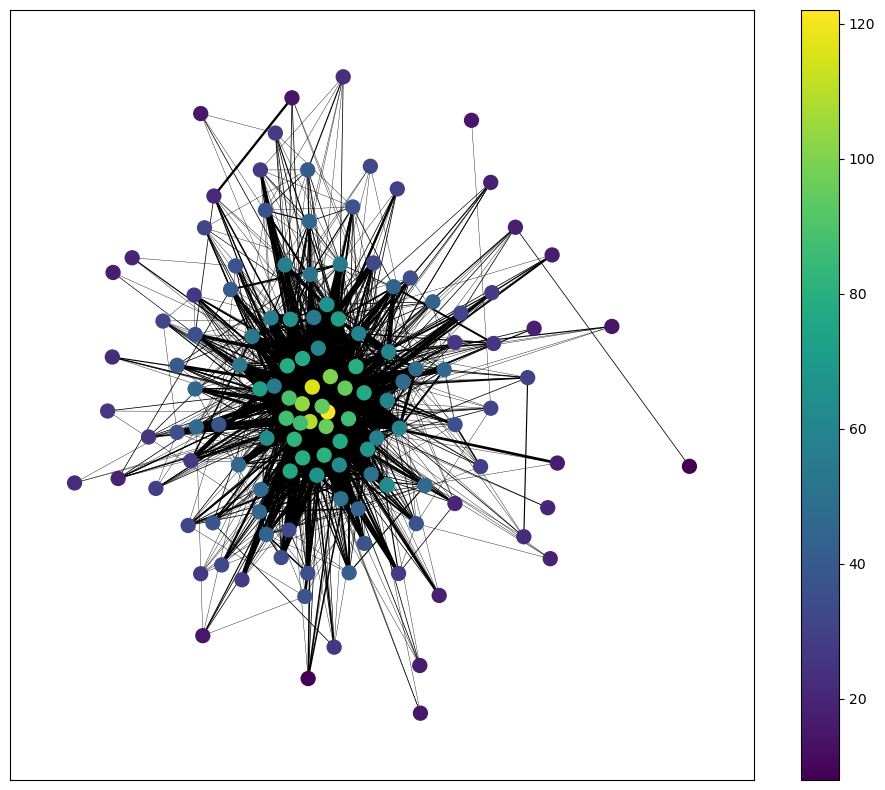

In [9]:
# Basic network using spring layout
# Gradient color correspond to nodes degree
plt.figure(figsize=(12,10))
pos_spring = nx.spring_layout(G, seed=4, k=.5)
deg = [val for (node, val) in G.degree()]

weight_of_edges = list(nx.get_edge_attributes(G, "weight").values())
print('The average degree of a node is '+ str(round(np.mean(deg),3)))
norm_weight = (np.array(weight_of_edges)-min(weight_of_edges))/(max(weight_of_edges)-min(weight_of_edges))

node = nx.draw_networkx_nodes(G, pos=pos_spring, node_size=100, cmap='viridis', node_color=deg)
nx.draw_networkx_edges(G, pos=pos_spring, alpha=1, width=norm_weight*30, edge_color='black')
plt.colorbar(node)
#plt.title('Coloring based on nodes degree')
plt.savefig('./images/basic_spring_network.png', dpi=500)
#plt.savefig('./images/basic_spring_network.svg', format='svg')
plt.show()

#### 2.1.2 Degree distribution

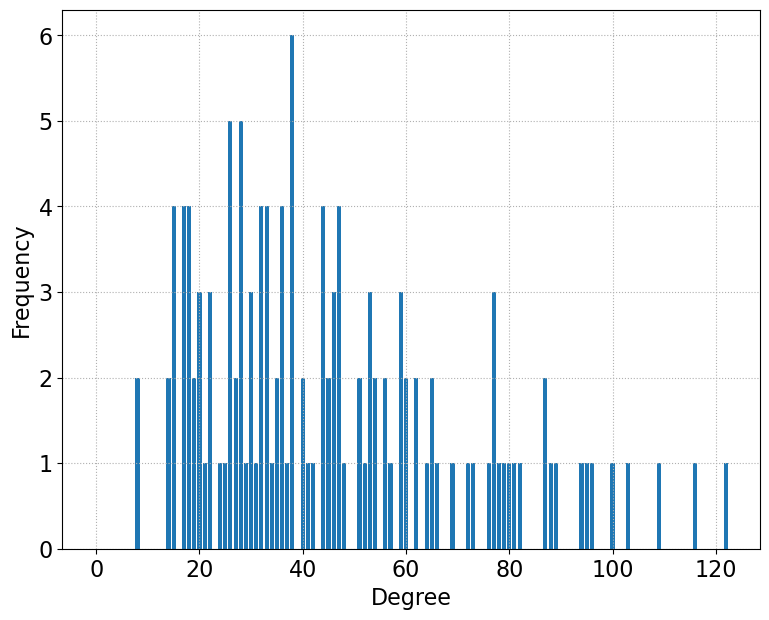

In [10]:
# degree distribution vizualisation
degree_freq = nx.degree_histogram(G)
degrees = range(len(degree_freq))
plt.figure(figsize=(9, 7))
plt.bar(degrees, degree_freq)
plt.grid(linestyle=':')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel('Degree', fontsize=16)
plt.ylabel('Frequency', fontsize=16)

plt.savefig('./images/degree_distribution.png', dpi=300)
plt.show()

#### 2.1.3 Centrality 


1) Degree centrality 

Degree centrality assigns an importance score based simply on the number of links held by each node
How many direct, ‘one hop’ connections each node has to other nodes in the network 

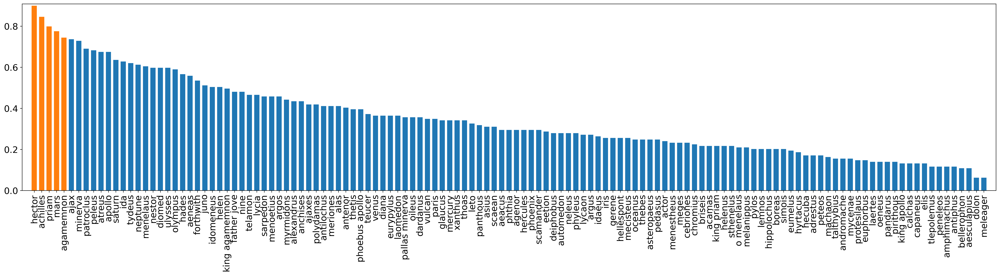

In [11]:
degree_centrality = nx.degree_centrality(G)
sorted_degree_centrality =  sorted(degree_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_degree_centrality)):
    plt.bar(sorted_degree_centrality[i][0], sorted_degree_centrality[i][1],
    color='tab:orange' if i<=5 else 'tab:blue',
    width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)
plt.margins(0.01)
plt.tight_layout()
plt.savefig('images/degree_centrality.png', dpi=500)
plt.savefig('images/degree_centrality.pdf', format='pdf', dpi=500)
plt.show()

2) Eigen centrality

EigenCentrality measures a node’s influence based on the number of links it has to other nodes in the network. 
EigenCentrality then goes a step further by also taking into account how well connected a node is, and how many links their connections have, and so on through the network.
By calculating the extended connections of a node, EigenCentrality can identify nodes with influence over the whole network, not just those directly connected to it.


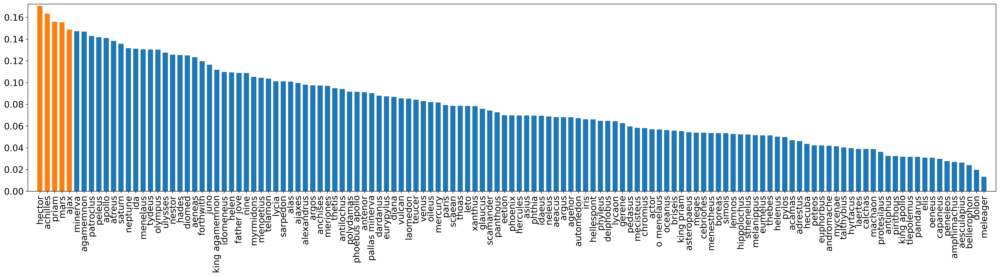

In [12]:
eigen_centrality = nx.eigenvector_centrality(G)
sorted_eigen_centrality =  sorted(eigen_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_eigen_centrality)):
    plt.bar(sorted_eigen_centrality[i][0], sorted_eigen_centrality[i][1], 
            color='tab:orange' if i<=5 else 'tab:blue',
            width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)
plt.margins(0.01)

plt.tight_layout()
plt.savefig('images/eigen_centrality.png', dpi=500)
plt.savefig('images/eigen_centrality.pdf', format='pdf', dpi=500)
plt.show()

3) Betwenness centrality

For finding the individuals who influence the flow around a system.
This measure shows which nodes are ‘bridges’ between nodes in a network 

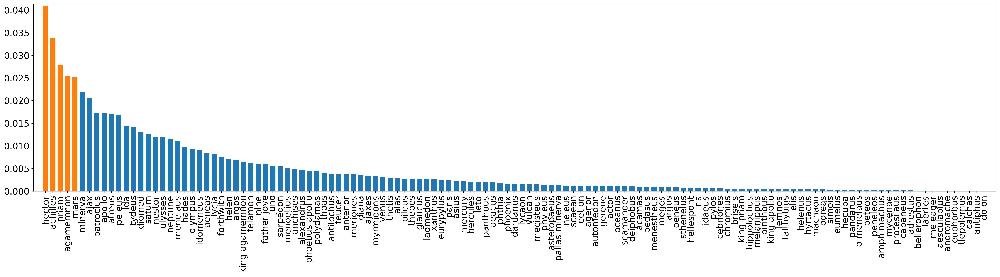

In [13]:
between_centrality = nx.betweenness_centrality(G)
sorted_between_centrality =  sorted(between_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_between_centrality)):
    plt.bar(sorted_between_centrality[i][0], sorted_between_centrality[i][1], 
            color='tab:orange' if i<=5 else 'tab:blue',
            width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)
plt.margins(0.01)

plt.tight_layout()
plt.savefig('images/between_centrality.png', dpi=500)
plt.savefig('images/between_centrality.pdf', format='pdf', dpi=500)
plt.show()

#### 2.1.4 Relationship between degree centrality and eigen/betweenness centrality


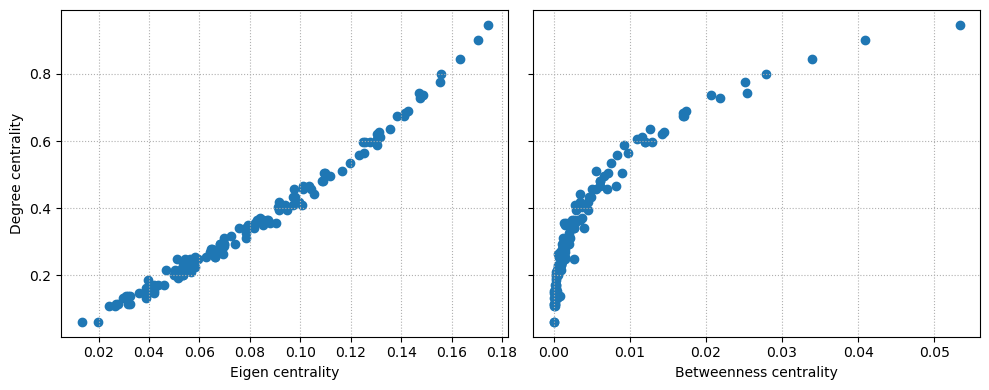

In [14]:
fig, ax = plt.subplots(1,2, figsize=(10,4), sharey=True)
ax[0].scatter(eigen_centrality.values(), degree_centrality.values())
ax[0].set_xlabel('Eigen centrality')
ax[0].set_ylabel('Degree centrality')
ax[0].grid(linestyle=':')

ax[1].scatter(between_centrality.values(), degree_centrality.values())
ax[1].set_xlabel('Betweenness centrality')
ax[1].grid(linestyle=':')

plt.tight_layout()
plt.savefig('images/centrality_measures_relationships.png', dpi=500)
#plt.savefig('images/centrality_measures_relationships.svg', format='svg')
plt.show()

### 2.1.5 PageRank algorithm

[('jove', 0.05734500386279089), ('hector', 0.05149174616727913), ('achilles', 0.044512406079501396), ('agamemnon', 0.027964608848157626), ('priam', 0.027816480000187258)]


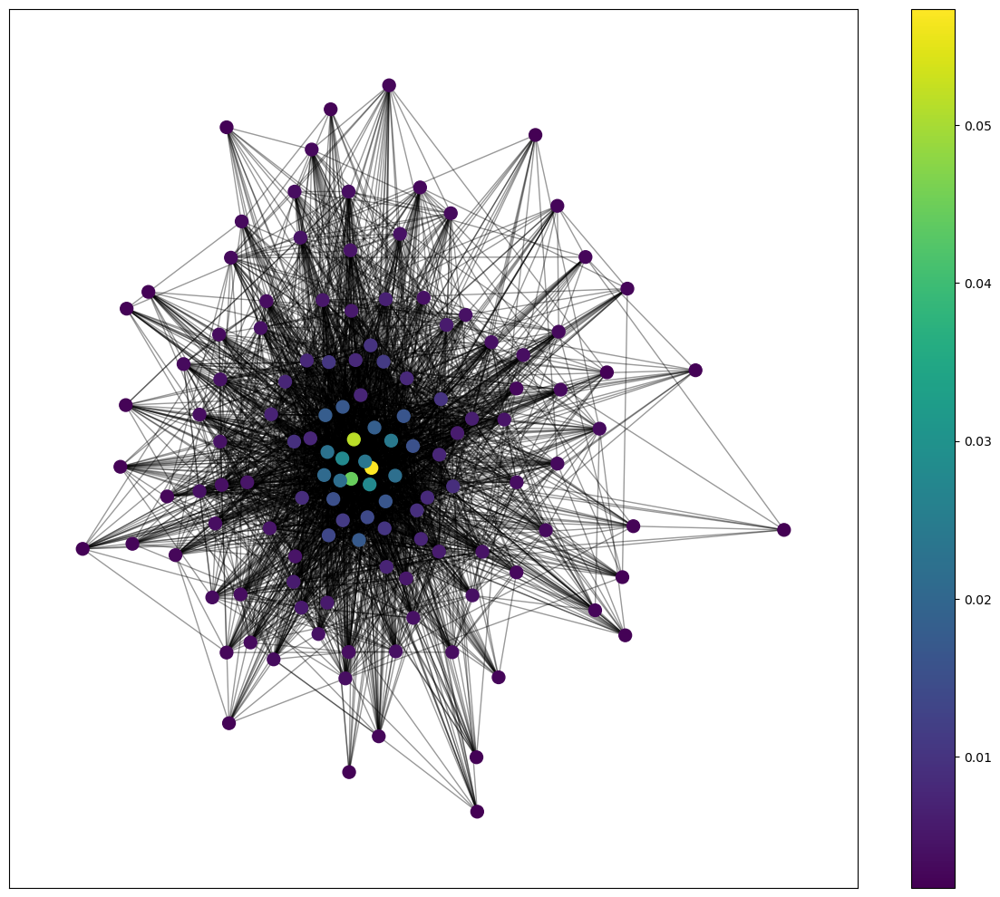

In [15]:
pr = nx.pagerank(G)
sorted_pagerank =  sorted(pr.items(), key=lambda x:x[1], reverse=True)
print(sorted_pagerank[:5])

plt.figure(figsize=(12,10))
node_pr = nx.draw_networkx_nodes(G, pos=pos_spring, node_size=100, cmap='viridis', node_color=list(pr.values()))
nx.draw_networkx_edges(G, pos_spring, alpha=0.4)
plt.colorbar(node_pr)

plt.tight_layout()
plt.savefig('./images/pagerank.png', dpi=500)
plt.savefig('./images/pagerank.pdf', dpi=500, format='pdf')

plt.show()

## 2.2 Detecting communities
### 2.2.1 Community detection with Louvain algorithm

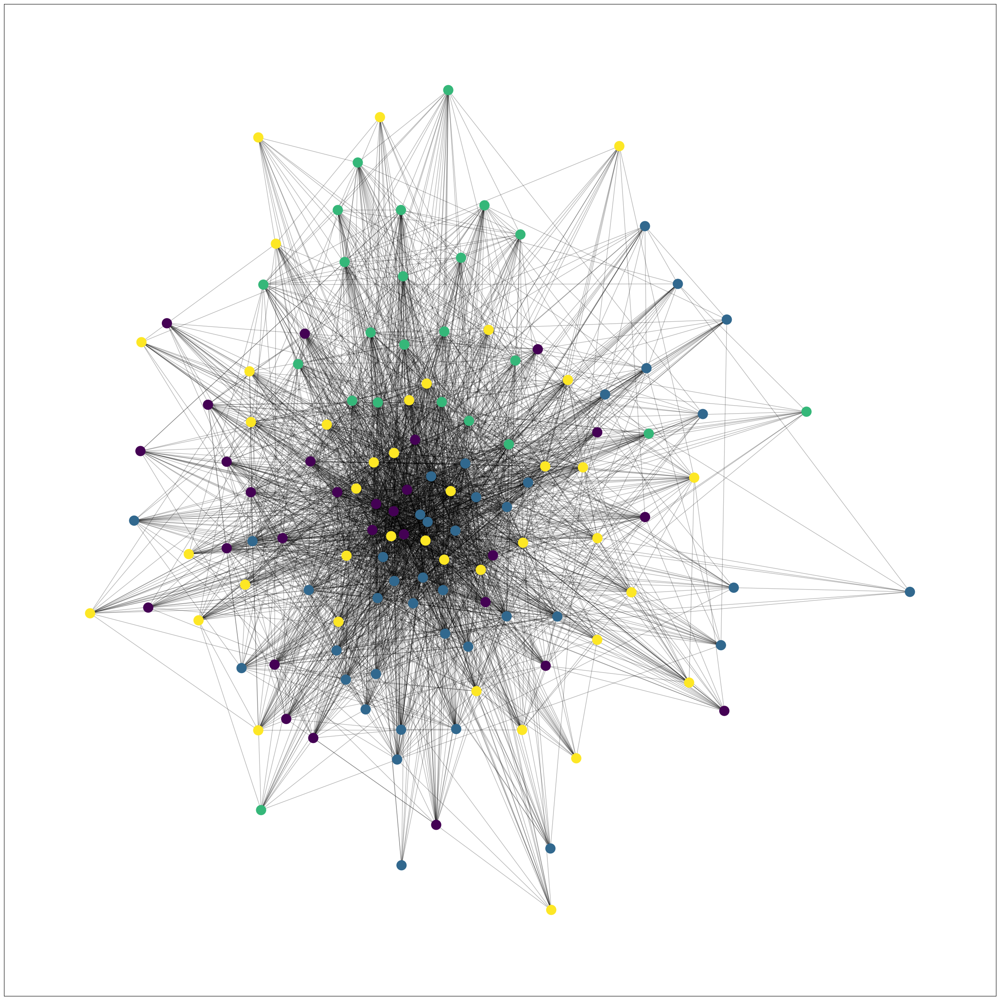

In [16]:
# community detection with louvain algorithm
louvain_partition = community_louvain.best_partition(G)
node_colors = list(louvain_partition.values())


plt.figure(figsize=(25,25))
cmap = cm.get_cmap('viridis', max(louvain_partition.values()) + 1)
nx.draw_networkx_nodes(G, pos_spring, louvain_partition.keys(),
                       node_color=node_colors,
                       cmap=cmap)
nx.draw_networkx_edges(G, pos=pos_spring, alpha=0.3)

plt.tight_layout()
plt.savefig('images/communities_spring.png', dpi=500)
plt.savefig('images/communities_spring.pdf', format='pdf', dpi=500)
plt.show()


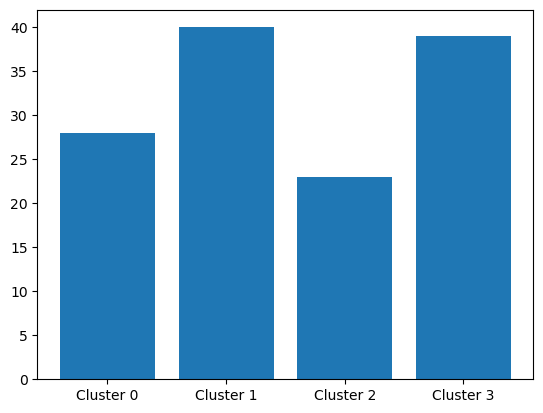

In [17]:
cluster0 = [] ; cluster1 = [] ; cluster2 = [] ; cluster3 = []
for character in characters:
    if louvain_partition[character] == 0:
        cluster0.append(character)
    elif louvain_partition[character] == 1:
        cluster1.append(character)
    elif louvain_partition[character] == 2:
        cluster2.append(character)
    else :
        cluster3.append(character)

cluster_len = [len(cluster0), len(cluster1), len(cluster2), len(cluster3)]
cluster_lst = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']

plt.figure()
plt.bar(cluster_lst, cluster_len)
plt.show()

In [18]:
print(cluster_len)
print(cluster0)
print(cluster1)
print(cluster2)
print(cluster3)

[28, 40, 23, 39]
['hector', 'achilles', 'priam', 'patroclus', 'peleus', 'hades', 'thetis', 'menoetius', 'lycaon', 'automedon', 'aeacus', 'phthia', 'myrmidons', 'alas', 'dardanus', 'scamander', 'scaean', 'lemnos', 'king priam', 'hellespont', 'eetion', 'actor', 'pedasus', 'hecuba', 'protesilaus', 'simois', 'andromache', 'euphorbus']
['jove', 'minerva', 'juno', 'mars', 'apollo', 'tydeus', 'olympus', 'diomed', 'saturn', 'neptune', 'ida', 'iris', 'phoebus apollo', 'vulcan', 'argos', 'venus', 'pallas minerva', 'father jove', 'mercury', 'oceanus', 'idaeus', 'xanthus', 'diana', 'hercules', 'leto', 'argus', 'thebes', 'laomedon', 'dolon', 'king apollo', 'sthenelus', 'oeneus', 'boreas', 'calchas', 'capaneus', 'pandarus', 'pirithous', 'nine', 'mycenae', 'meleager']
['aeneas', 'sarpedon', 'alexandrus', 'helen', 'polydamas', 'antenor', 'glaucus', 'deiphobus', 'lycia', 'paris', 'asius', 'agenor', 'panthous', 'bellerophon', 'asteropaeus', 'acamas', 'tlepolemus', 'anchises', 'helenus', 'hippolochus', '

### 2.2.2 Spectral clustering on the Laplacian

[[1294 -109  -83 ...    0    0   -1]
 [-109 1459  -71 ...   -1   -1    0]
 [ -83  -71 1124 ...   -2    0   -2]
 ...
 [   0   -1   -2 ...   20    0    0]
 [   0   -1    0 ...    0   10    0]
 [  -1    0   -2 ...    0    0   19]]


<class 'networkx.utils.decorators.argmap'> compilation 20:4: FutureWarning:

laplacian_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.



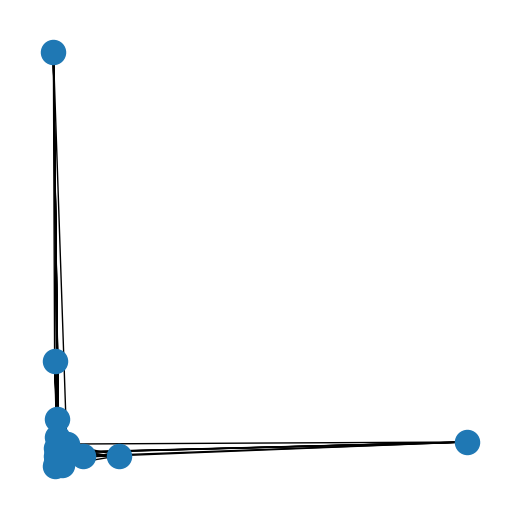

In [19]:
# compute the Laplacian
L = nx.laplacian_matrix(G).todense()
print(L)

# Draw the communities in 2D with the Laplacian method
plt.figure(figsize=(5,5))
nx.draw(G, pos=nx.spectral_layout(G))
plt.savefig('./images/laplacian', dpi=500)
plt.show()

In [20]:
# Plot of the 3-dimensional embedding of the nodes
spectral_coords = nx.spectral_layout(G, dim=3)
spectral_coords = list(zip(*spectral_coords.values()))

trace = go.Scatter3d(
    x=spectral_coords[0],
    y=spectral_coords[1],
    z=spectral_coords[2],
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
)

data = [trace]
camera = dict(eye=dict(x=1.5, y=1.5, z=0.1))

plot_figure = go.Figure(data=data, layout=layout)
plot_figure.update_layout(scene_camera=camera)



# Render & save the plot 
plotly.offline.iplot(plot_figure)
plot_figure.write_html("./images/plotly_fig.html")
plot_figure.write_image("./images/plotly_fig.png")


### 2.2.3 K-means method

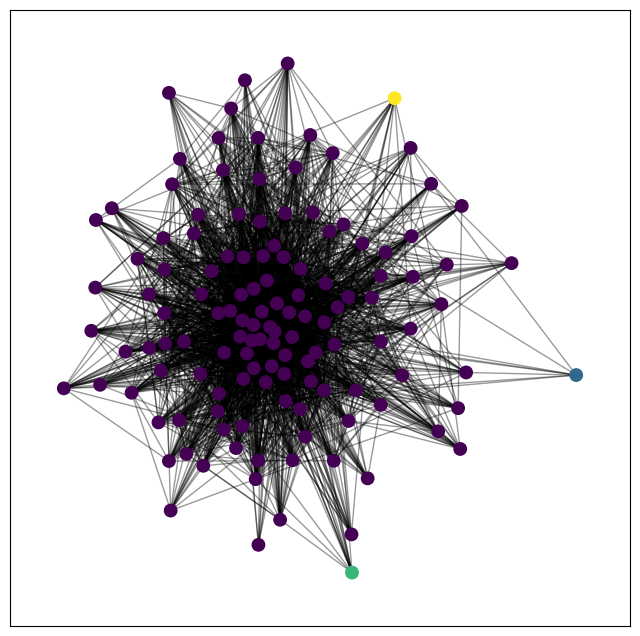

[127, 1, 1, 1]


In [21]:
spectral_coords = nx.spectral_layout(G, dim=3)
partitions_kmeans = sklearn.cluster.KMeans(n_clusters=4).fit_predict([spectral_coords[node] for node in G.nodes()])

plt.figure(figsize=(8,8))
nx.draw_networkx_nodes(G, pos_spring, node_color=partitions_kmeans, node_size=80)
nx.draw_networkx_edges(G, pos_spring, alpha=0.4)

plt.savefig('./images/kmeans.png', dpi=500)
plt.show()

len_kmeans = [list(partitions_kmeans).count(0), list(partitions_kmeans).count(1),
              list(partitions_kmeans).count(2), list(partitions_kmeans).count(3)]
print(len_kmeans)

### 2.2.4 Girvan-Newman algorithm

meleager
-4.2472764344927437e-07


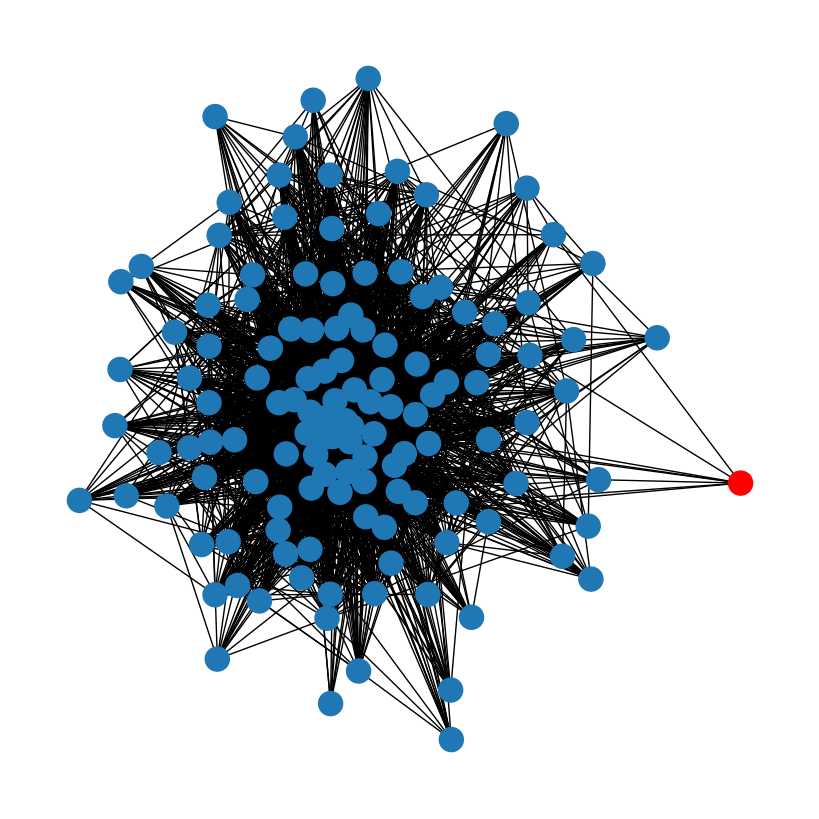

In [35]:
from networkx.algorithms.community.centrality import girvan_newman
import networkx.algorithms.community as nx_comm

gn_com = girvan_newman(G)
node_groups = []
for com in next(gn_com):
    node_groups.append(list(com))

colors = []
for node in G:
    if node in node_groups[0]:
        colors.append('tab:blue')
    else:
        colors.append('red')
        print(node)

plt.figure(figsize=(8,8))
nx.draw(G, pos_spring, node_color=colors)

plt.savefig('./images/girvan_newman.png', dpi=500)
plt.savefig('./images/girvan_newman.pdf', dpi=500, format='pdf')

modularity = nx_comm.modularity(G, node_groups)
print(modularity)


### 2.3 SIR model over network
#### 2.3.1 First infected node is highly connected
The first character infected is Hector, who is the more connected in the entire network as described before

In [ ]:
#github link : https://python.plainenglish.io/visualizing-dynamic-phenomena-with-sir-model-and-networks-45a4e629e609
import EoN

gamma = 0.125  
beta = 0.1693

r_0 = beta/gamma
print('R0 = ' + str(r_0))
N = len(G.nodes())  # population size
I0 = 1              # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G)
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the


print("Doing SIR simulation")
sim = EoN.Gillespie_SIR(G, initial_infecteds = ['hector'], tau = beta, gamma=gamma, return_full_data=True)
print("Done with simulation, now plotting")

for i in range(0,45,1):
    sim.display(time = i, ts_plots=["SIR"],**nx_kwargs)
    fig = plt.gcf()
    fig.set_size_inches(15, 8, forward=True)
    plt.axis('on')
    plt.title("Iteration {}".format(i))
    #plt.draw()
    plt.savefig('./gif_hector/'+str(i) +'.png')

In [ ]:
import matplotlib.animation as animation
anim = sim.animate()
anim.save('the_movie.gif', writer = 'mencoder', fps=15)

#### 2.3.2 First node infected is poorly connected
The first character infected is Briseis. She is not the less connected in this network but is definetly less connected than Hector

In [ ]:
#github link : https://python.plainenglish.io/visualizing-dynamic-phenomena-with-sir-model-and-networks-45a4e629e609
import EoN

beta = 0.1693       # Infection rate
gamma = 0.125       # Recovery rate


r_0 = beta/gamma
print(r_0)
N = len(G.nodes())  # population size
I0 = 1              # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G)
#edgewidth = [d['weight'] for (u,v,d) in G.edges(data=True)]
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the


print("Doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G, initial_infecteds = ['briseis'], tau = beta, gamma=gamma, return_full_data=True)
#network_ax, timeseries_axes = sim.display(time=1)
print("Done with simulation, now plotting")


for i in range(0,45,1):
    sim.display(time = i, ts_plots=["SIR"],**nx_kwargs)
    fig = plt.gcf()
    fig.set_size_inches(15, 8, forward=True)
    plt.axis('on')
    plt.title("Iteration {}".format(i))
    plt.draw()
    plt.savefig('./gif_briseis/'+str(i) +'.png')

## 3. SIR by solving ODEs
Here we compare our solution on our network with the theoretical solution from the ODEs describing the SIR model

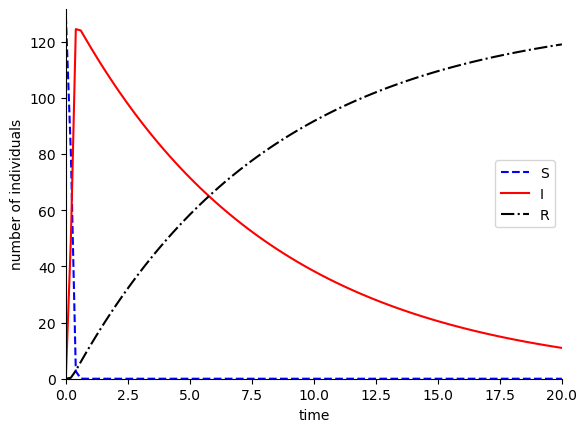

In [36]:
from scipy.integrate import odeint

N  = 130                    # total number of individuals
I0 = 1                      # initial number of infectives
S0 = N-I0                   # initial number of susceptibles
R0 = 0                      # initial number of recovered individuals
z0 = [S0,I0,R0]             # initial condition
r  = 0.1693                 # infection rate [1/(ind*day)]
a  = 0.125                  # removal rate of infectives [1/day]
ti = 0                      # initial time
tf = 20                     # final time
nt = 101                    # number of time points
t  = np.linspace(ti,tf,nt)  # time points

# function that returns dy/dt
def model(z,t,r,a):
    S = z[0]
    I = z[1]
    R = z[2]
    dSdt = -r*S*I
    dIdt = +r*S*I - a*I
    dRdt = +a*I
    dzdt = [dSdt,dIdt,dRdt]
    return dzdt

# Time evolution
z = odeint(model,z0,t,args=(r,a))
S = z[:,0]
I = z[:,1]
R = z[:,2]

# plot timeseries
plt.plot(t,S,'--b',label='S')
plt.plot(t,I,'r',label='I')
plt.plot(t,R,'-.k',label='R')
ax = plt.gca()
plt.xlabel('time')
plt.ylabel('number of individuals')
plt.legend(loc='best')
plt.axis((t[0],t[-1],0,1.02*np.max(z)))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.savefig('./images/SIR.pdf', dpi=500, format='pdf')
plt.show()